In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display
from sklearn.metrics import mean_squared_error
from skimage import exposure
from skimage.metrics import structural_similarity as ssim

***
## Question1 - PartA
***

In [7]:
image = cv2.imread('image1.jpeg')

In [8]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

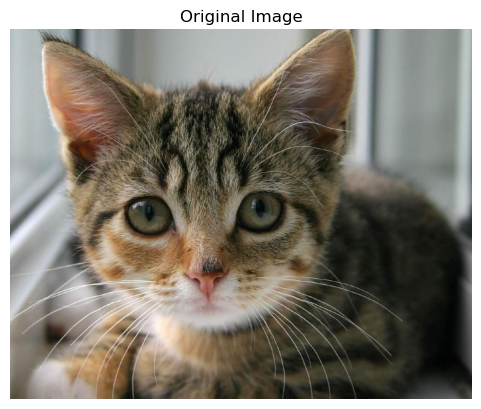

In [9]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

***
## Question1 - PartB
***

Split the image into RGB channels

In [10]:
r, g, b = cv2.split(image_rgb)

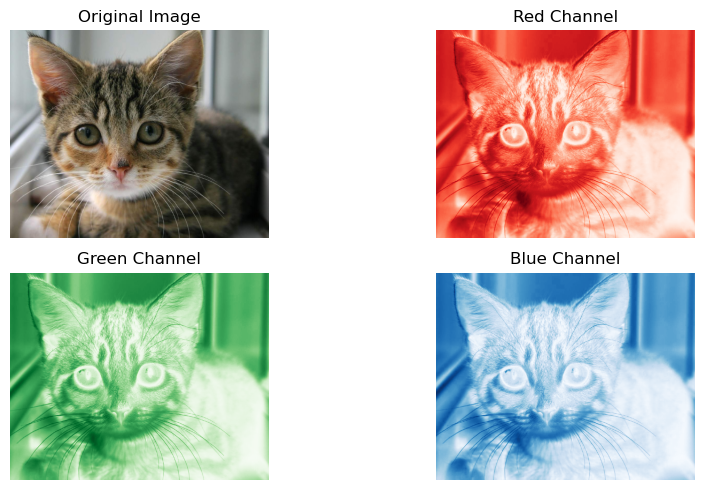

In [13]:
plt.figure(figsize=(10, 5))

plt.subplot(2, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Display each channel
plt.subplot(2, 2, 2)
plt.imshow(r, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(g, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(b, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

***
## Question1 - PartC
***

for grayscale image : iterate over each pixel of the image, calculate the luminance value, and set the corresponding pixel in the grayscale image.

for binary image : apply thresholding by setting pixel values above the threshold to 255 (white) and below the threshold to 0 (black).

In [20]:
image = Image.open('image1.jpeg')

In [21]:
width, height = image.size

In [22]:
gray_image = Image.new('L', (width, height))
binary_image = Image.new('L', (width, height))

In [23]:
for y in range(height):
    for x in range(width):
        
        # Get the RGB values of the pixel
        r, g, b = image.getpixel((x, y))
        
        # Calculate the luminance value
        luminance = int(0.299 * r + 0.587 * g + 0.114 * b)
        
        gray_image.putpixel((x, y), luminance)

        # Apply thresholding
        threshold = 127 
        if luminance > threshold:
            binary_image.putpixel((x, y), 255)  # White
        else:
            binary_image.putpixel((x, y), 0)    # Black

display grayscale image

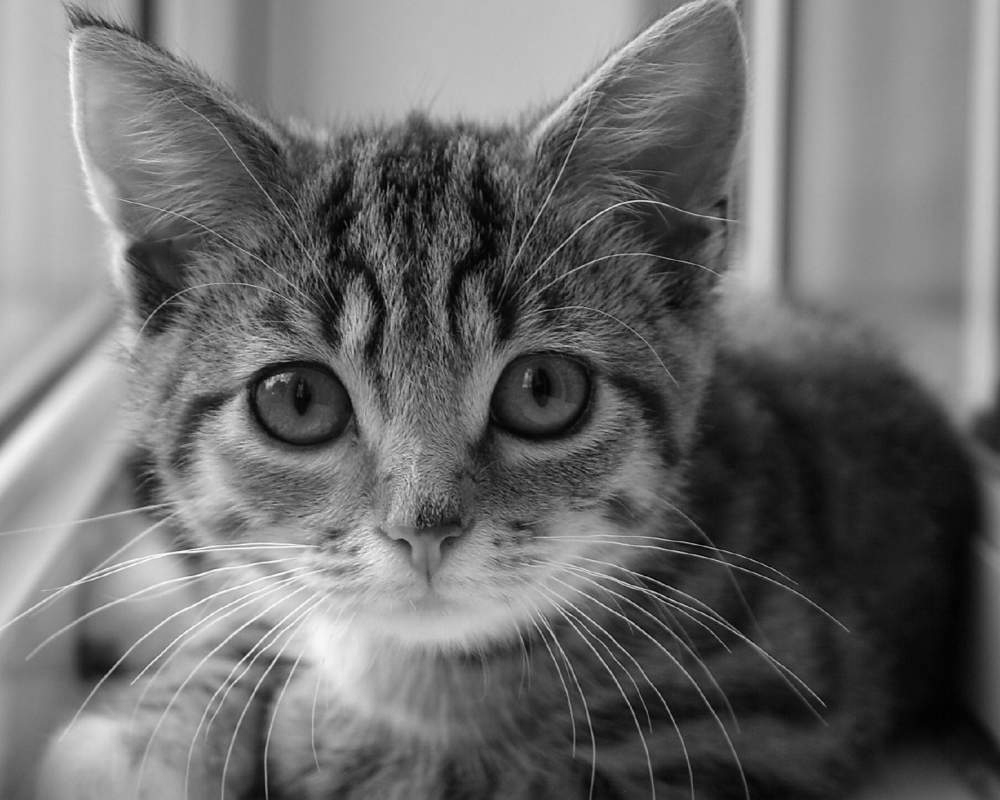

In [27]:
display(gray_image)

display binary image

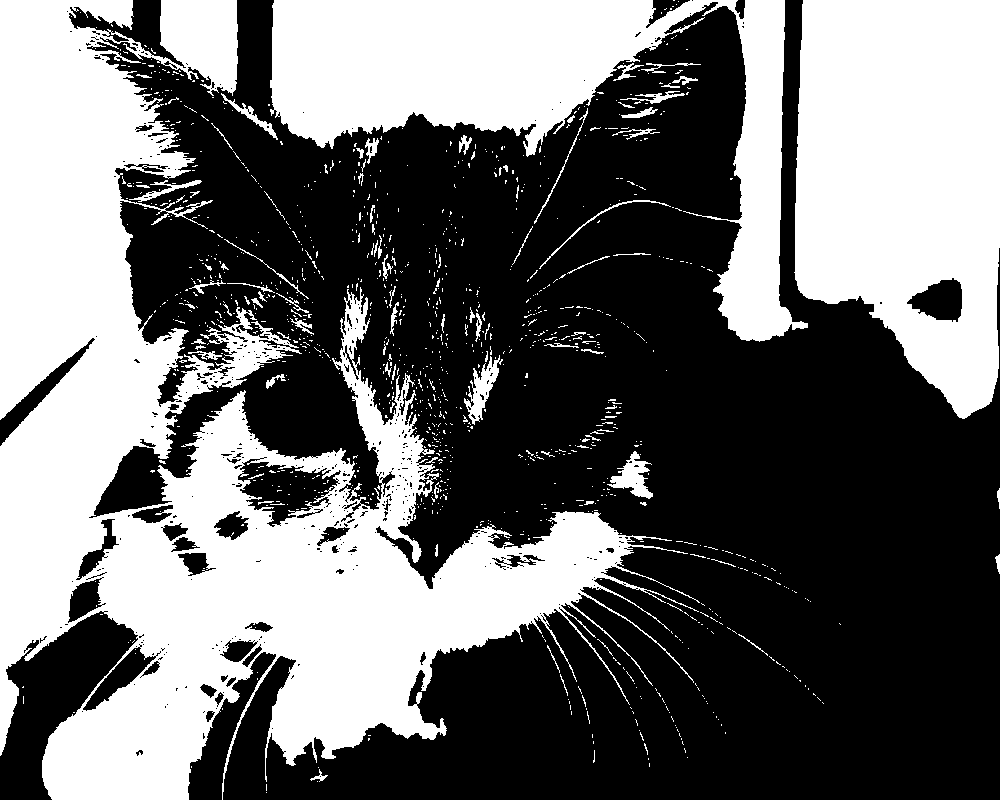

In [28]:
display(binary_image)

***
## Question1 - PartD
***

In [103]:
def rgb_to_hsv(r, g, b):
    r, g, b = r / 255.0, g / 255.0, b / 255.0
    cmax = max(r, g, b)
    cmin = min(r, g, b)
    delta = cmax - cmin
    
    # Calculate hue
    if delta == 0:
        hue = 0
    elif cmax == r:
        hue = 60 * (((g - b) / delta) % 6)
    elif cmax == g:
        hue = 60 * (((b - r) / delta) + 2)
    else:
        hue = 60 * (((r - g) / delta) + 4)
    
    # Calculate saturation
    if cmax == 0:
        saturation = 0
    else:
        saturation = delta / cmax
    
    # Calculate value
    value = cmax
    
    return hue, saturation, value

In [104]:
hsv_image = Image.new('RGB', (width, height))

Convert each pixel from RGB to HSV

In [105]:
for y in range(height):
    for x in range(width):
        r, g, b = image.getpixel((x, y))
        hue, saturation, value = rgb_to_hsv(r, g, b)
        # Normalize the values to the range [0, 255]
        hue = int((hue / 360) * 255)
        saturation = int(saturation * 255)
        value = int(value * 255)
        hsv_image.putpixel((x, y), (hue, saturation, value))

display HSV image

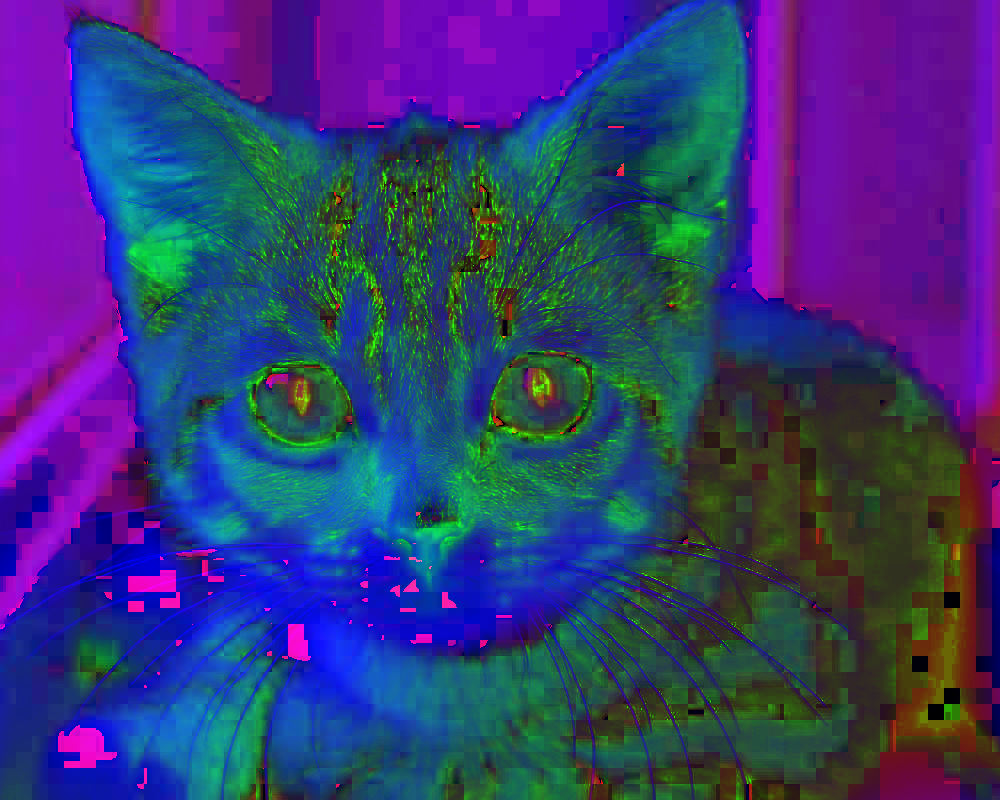

In [106]:
display(hsv_image)

***
## Question1 - PartE
***

In [73]:
image_np = np.array(image)

In [74]:
hsv_cv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)

display both images

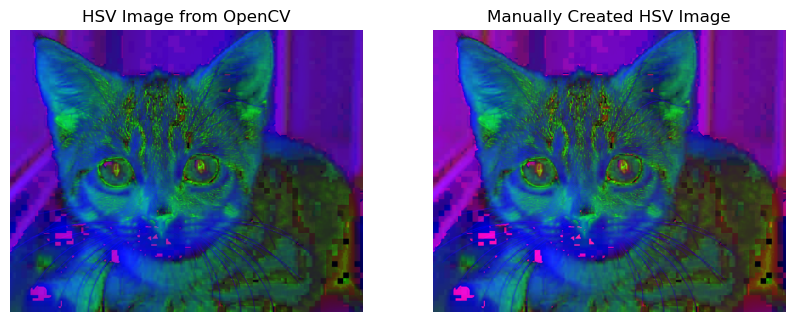

In [69]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(hsv_cv)
plt.title('HSV Image from OpenCV')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(hsv_image)
plt.title('Manually Created HSV Image')
plt.axis('off')

plt.show()

In [56]:
hsv_cv_flat = hsv_cv_array.flatten()
hsv_image_flat = hsv_image_array.flatten()

Calculate the Mean Squared Error (MSE)

In [58]:
mse = mean_squared_error(hsv_cv_flat, hsv_image_flat)

In [59]:
print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 30.437167916666667


Calculate the absolute difference between the images

In [60]:
diff = np.abs(hsv_cv_array - hsv_image_array)

Set a threshold for highlighting differences

In [61]:
threshold = 10

In [62]:
mask = diff > threshold
mask = mask.astype(np.uint8) * 255

blending the two images with the mask

In [63]:
blended_image = cv2.addWeighted(hsv_cv_array, 0.5, mask, 0.5, 0)

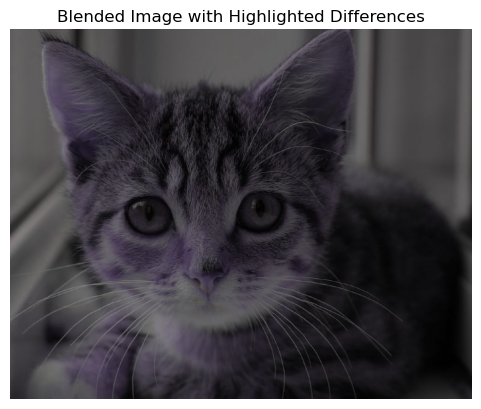

In [64]:
plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_HSV2RGB))
plt.title('Blended Image with Highlighted Differences')
plt.axis('off')
plt.show()

In [65]:
num_different_pixels = np.sum(mask) // 255
total_pixels = mask.size
percent_different = (num_different_pixels / total_pixels) * 100
print("Percentage of different pixels:", percent_different)

Percentage of different pixels: 32.86804166666666


***
## Question1 - PartF
***

When trying to extract the color red from an image using the HSV color space, it's important to understand what HSV represents. HSV is an acronym for Hue, Saturation, and Value. Hue represents the color itself, Saturation represents the intensity or purity of the color, and Value represents the brightness of the color.

To isolate red, you need to identify the range of HSV values that correspond to the color red. This range typically includes a range of hues that correspond to red, along with appropriate values for saturation and value to capture different shades and brightness levels of red.

Next, you create a mask using these HSV values. The mask is a binary image where pixels within the specified range are set to white (255), while pixels outside the range are set to black (0). This mask helps you identify regions in the image that contain the color red.

Finally, you apply the mask to the original image using bitwise operations. This ensures that only those pixels from the original image where the corresponding pixel in the mask is white (255) are retained, effectively highlighting regions in the image that contain the color red.

Define a range of HSV values for the color red

In [122]:
image_array = np.array(image)

In [123]:
lower_red = np.array([0, 70, 50])
upper_red = np.array([10, 255, 255])

In [124]:
mask = cv2.inRange(hsv_cv, lower_red, upper_red)

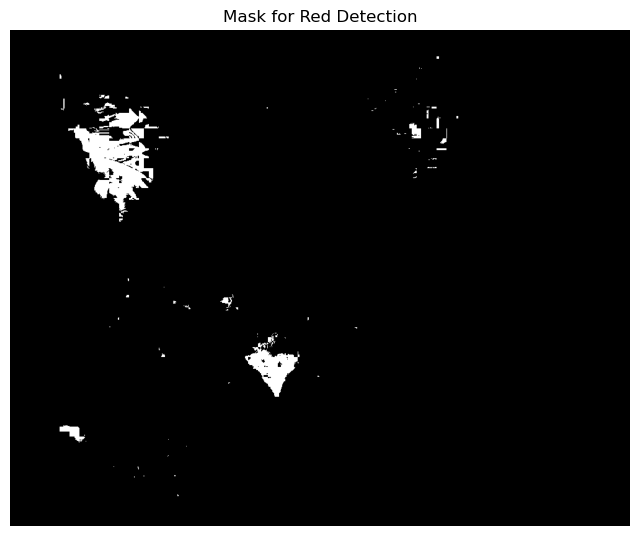

In [125]:
plt.figure(figsize=(8, 8))
plt.imshow(mask, cmap='gray')
plt.axis('off')
plt.title('Mask for Red Detection')
plt.show()

In [126]:
result = cv2.bitwise_and(image_array, image_array, mask=mask)

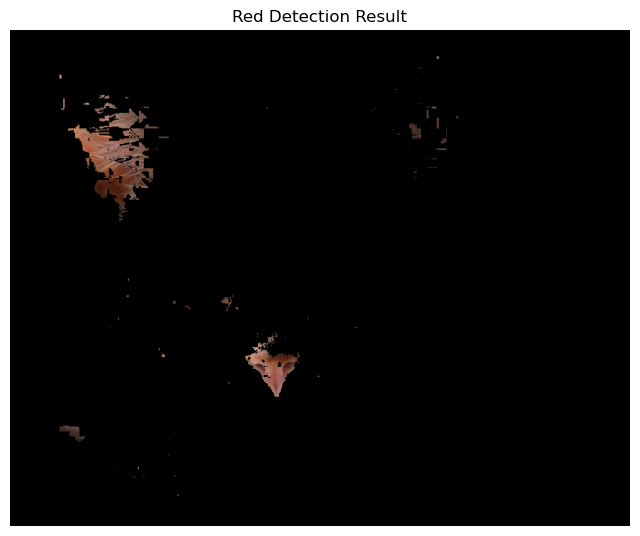

In [127]:
plt.figure(figsize=(8, 8))
plt.imshow(result)
plt.axis('off')
plt.title('Red Detection Result')
plt.show()

***
## Question2
***

In [139]:
image1 = cv2.imread('image2.1.jpg')
image2 = cv2.imread('image2.2.jpg')

In [140]:
image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

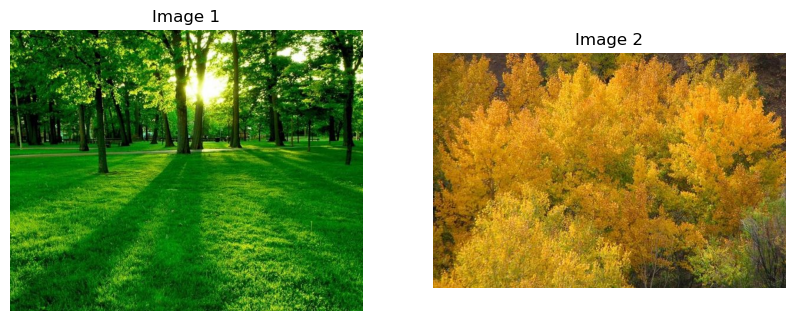

In [141]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image1_rgb)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image2_rgb)
plt.title('Image 2')
plt.axis('off')

plt.show()

plot RGB histogram

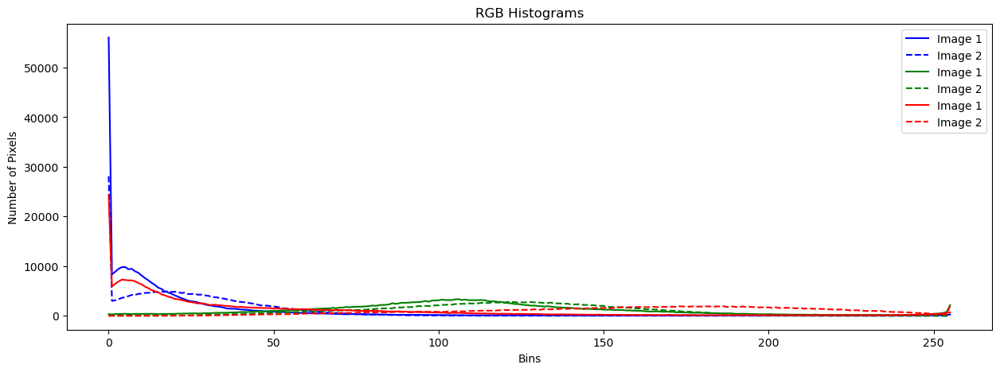

In [146]:
colors = ('b', 'g', 'r')
plt.figure(figsize=(15, 5))

for i, col in enumerate(colors):
    hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256])
    hist2 = cv2.calcHist([image2], [i], None, [256], [0, 256])
    
    plt.plot(hist1, color=col, label='Image 1')
    plt.plot(hist2, color=col, linestyle='dashed', label='Image 2')

plt.title('RGB Histograms')
plt.xlabel('Bins')
plt.ylabel('Number of Pixels')
plt.legend()
plt.show()

In [152]:
image1_lab = cv2.cvtColor(image1, cv2.COLOR_BGR2LAB)
image2_lab = cv2.cvtColor(image2, cv2.COLOR_BGR2LAB)

In [153]:
matched_image_lab = exposure.match_histograms(image1_lab, image2_lab, multichannel=True)

C:\Users\asus\AppData\Local\Temp\ipykernel_30420\2164527630.py:1: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  matched_image_lab = exposure.match_histograms(image1_lab, image2_lab, multichannel=True)


In [154]:
matched_image = cv2.cvtColor(matched_image_lab, cv2.COLOR_LAB2BGR)

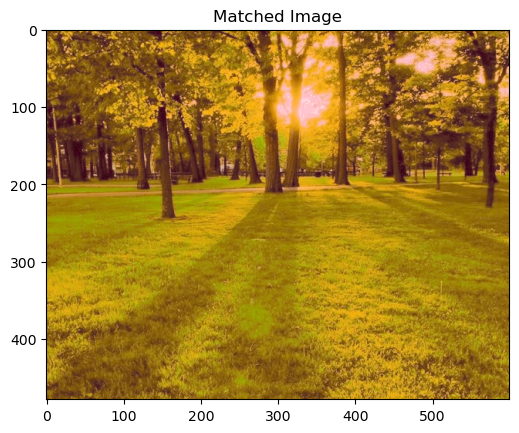

In [155]:
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Matched Image')
plt.show()

Plot histograms of original and matched image

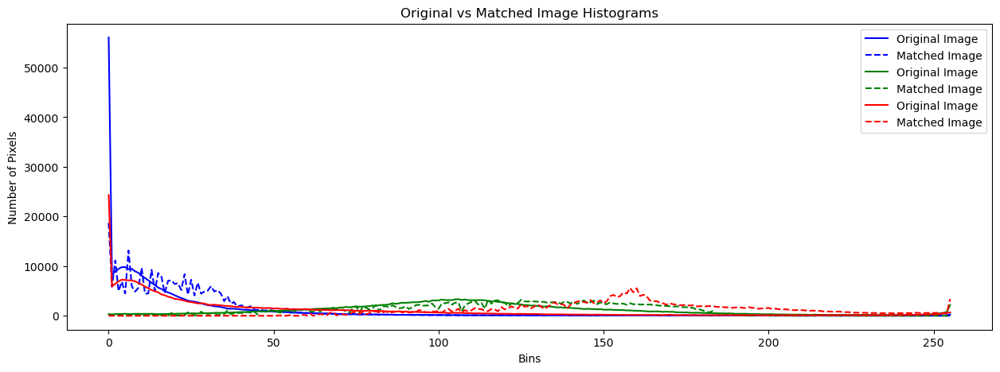

In [156]:
plt.figure(figsize=(15, 5))

for i, col in enumerate(colors):
    hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256])
    hist2 = cv2.calcHist([matched_image], [i], None, [256], [0, 256])
    
    plt.plot(hist1, color=col, label='Original Image')
    plt.plot(hist2, color=col, linestyle='dashed', label='Matched Image')

plt.title('Original vs Matched Image Histograms')
plt.xlabel('Bins')
plt.ylabel('Number of Pixels')
plt.legend()
plt.show()

In [160]:
correlations_before = []
correlations_after = []

for i in range(3):
    hist1_before = cv2.calcHist([image1], [i], None, [256], [0, 256])
    hist2_before = cv2.calcHist([image2], [i], None, [256], [0, 256])
    hist1_after = cv2.calcHist([matched_image], [i], None, [256], [0, 256])
    correlation_before = cv2.compareHist(hist1_before, hist2_before, cv2.HISTCMP_CORREL)
    correlation_after = cv2.compareHist(hist1_after, hist2_before, cv2.HISTCMP_CORREL)
    correlations_before.append(correlation_before)
    correlations_after.append(correlation_after)

In [161]:
print("Correlation Coefficients for each channel before matching:")
print("Blue Channel: ", correlations_before[0])
print("Green Channel:", correlations_before[1])
print("Red Channel:  ", correlations_before[2])

Correlation Coefficients for each channel before matching:
Blue Channel:  0.9180215708964905
Green Channel: 0.8723153396397735
Red Channel:   -0.5725235548556672


In [162]:
print("\nCorrelation Coefficients for each channel after matching:")
print("Blue Channel: ", correlations_after[0])
print("Green Channel:", correlations_after[1])
print("Red Channel:  ", correlations_after[2])


Correlation Coefficients for each channel after matching:
Blue Channel:  0.8672500289630011
Green Channel: 0.9394977858349276
Red Channel:   0.8042276048608498


### Correlation Coefficients for each channel before matching:
- **Blue Channel:** 0.918
  - Strong positive correlation, indicating similarity in blue color distribution.
  
- **Green Channel:** 0.872
  - Strong positive correlation, suggesting similarity in green color distribution.
  
- **Red Channel:** -0.573
  - Negative correlation, indicating differences in red color distribution. Magnitude of correlation is weaker compared to blue and green channels.

### Correlation Coefficients for each channel after matching:
- **Blue Channel:** 0.867
  - Slightly lower but still indicates strong positive correlation, preserving similarity in blue color distribution.
  
- **Green Channel:** 0.939
  - Significantly higher than before, showing further alignment in green color distribution.
  
- **Red Channel:** 0.804
  - Changed from negative to positive, indicating improvement in similarity of red color distribution.

### Overall Analysis:
- Histogram matching effectively aligned color distributions between images.
- Green channel shows significant improvement, while red channel corrected its negative correlation.
- Despite slight decreases in some correlation coefficients, overall similarity between images has been improved.


***
## Question3 - PartA
***

In [239]:
image = cv2.imread('image3.jpg')

In [240]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

apply filters

In [241]:
filtered_image_3x3 = cv2.blur(image_rgb, (3, 3))
filtered_image_3x3 = cv2.blur(filtered_image_3x3, (3, 3))
filtered_image_9x9 = cv2.blur(image_rgb, (9, 9))
filtered_image_gaussian = cv2.GaussianBlur(image_rgb, (5, 5), 0)

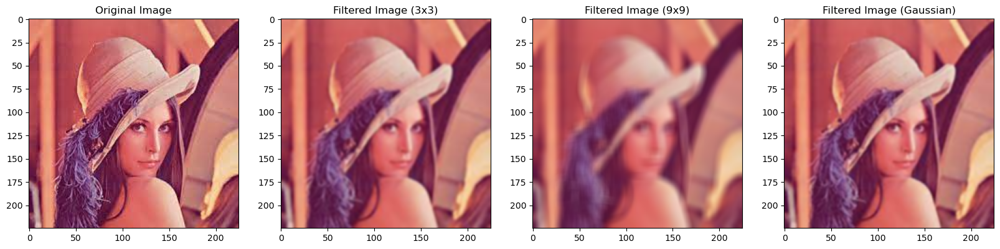

In [242]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(filtered_image_3x3)
plt.title('Filtered Image (3x3)')

plt.subplot(1, 4, 3)
plt.imshow(filtered_image_9x9)
plt.title('Filtered Image (9x9)')

plt.subplot(1, 4, 4)
plt.imshow(filtered_image_gaussian)
plt.title('Filtered Image (Gaussian)')

plt.show()

In [243]:
filtered_image_3x3_bgr = cv2.cvtColor(filtered_image_3x3, cv2.COLOR_RGB2BGR)
filtered_image_9x9_bgr = cv2.cvtColor(filtered_image_9x9, cv2.COLOR_RGB2BGR)
filtered_image_gaussian_bgr = cv2.cvtColor(filtered_image_gaussian, cv2.COLOR_RGB2BGR)

Compare histograms

In [244]:
hist_original_r = cv2.calcHist([image_rgb], [0], None, [256], [0, 256])
hist_original_g = cv2.calcHist([image_rgb], [1], None, [256], [0, 256])
hist_original_b = cv2.calcHist([image_rgb], [2], None, [256], [0, 256])

hist_3x3_r = cv2.calcHist([filtered_image_3x3], [0], None, [256], [0, 256])
hist_3x3_g = cv2.calcHist([filtered_image_3x3], [1], None, [256], [0, 256])
hist_3x3_b = cv2.calcHist([filtered_image_3x3], [2], None, [256], [0, 256])

hist_9x9_r = cv2.calcHist([filtered_image_9x9], [0], None, [256], [0, 256])
hist_9x9_g = cv2.calcHist([filtered_image_9x9], [1], None, [256], [0, 256])
hist_9x9_b = cv2.calcHist([filtered_image_9x9], [2], None, [256], [0, 256])

hist_gaussian_r = cv2.calcHist([filtered_image_gaussian], [0], None, [256], [0, 256])
hist_gaussian_g = cv2.calcHist([filtered_image_gaussian], [1], None, [256], [0, 256])
hist_gaussian_b = cv2.calcHist([filtered_image_gaussian], [2], None, [256], [0, 256])

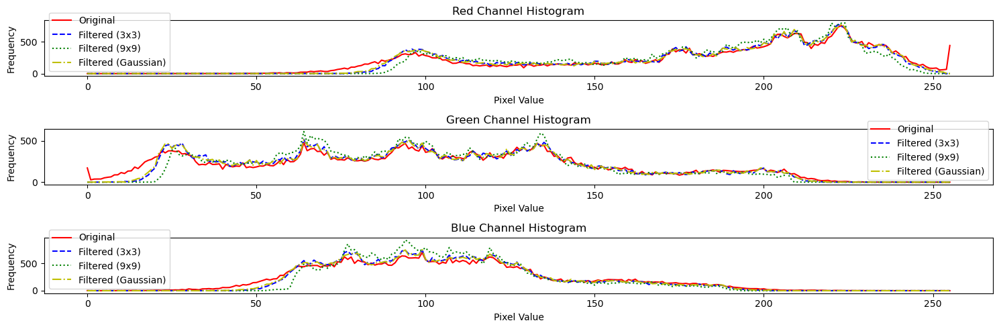

In [245]:
plt.figure(figsize=(15, 5))

plt.subplot(3, 1, 1)
plt.plot(hist_original_r, color='r', label='Original')
plt.plot(hist_3x3_r, color='b', linestyle='dashed', label='Filtered (3x3)')
plt.plot(hist_9x9_r, color='g', linestyle='dotted', label='Filtered (9x9)')
plt.plot(hist_gaussian_r, color='y', linestyle='dashdot', label='Filtered (Gaussian)')
plt.title('Red Channel Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(hist_original_g, color='r', label='Original')
plt.plot(hist_3x3_g, color='b', linestyle='dashed', label='Filtered (3x3)')
plt.plot(hist_9x9_g, color='g', linestyle='dotted', label='Filtered (9x9)')
plt.plot(hist_gaussian_g, color='y', linestyle='dashdot', label='Filtered (Gaussian)')
plt.title('Green Channel Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(hist_original_b, color='r', label='Original')
plt.plot(hist_3x3_b, color='b', linestyle='dashed', label='Filtered (3x3)')
plt.plot(hist_9x9_b, color='g', linestyle='dotted', label='Filtered (9x9)')
plt.plot(hist_gaussian_b, color='y', linestyle='dashdot', label='Filtered (Gaussian)')
plt.title('Blue Channel Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()

In [246]:
filters = [
    ('Filtered (3x3)', cv2.blur, (3, 3)),
    ('Filtered (9x9)', cv2.blur, (9, 9)),
    ('Filtered (Gaussian)', cv2.GaussianBlur, (5, 5), 0)
]

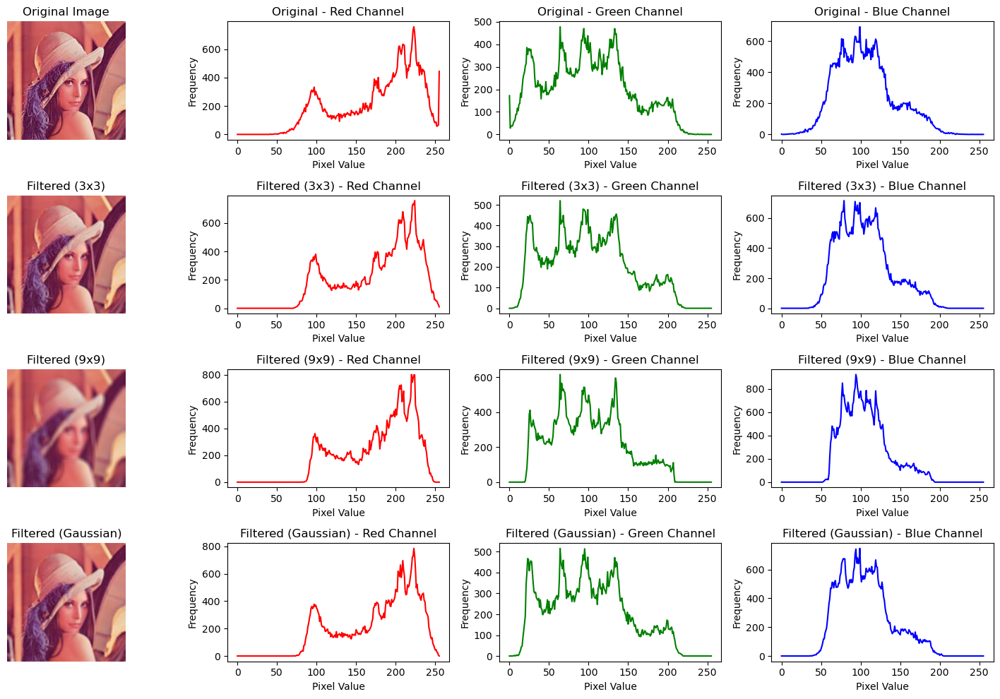

In [247]:
plt.figure(figsize=(15, 10))
plt.subplot(4, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# plot histogram for original image
for i, color in enumerate(['Red', 'Green', 'Blue']):
    hist = cv2.calcHist([image_rgb], [i], None, [256], [0, 256])
    plt.subplot(4, 4, i+2)
    plt.plot(hist, color=color)
    plt.title(f'Original - {color} Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')


for j, (filter_name, filter_func, *args) in enumerate(filters, start=1):

    filtered_image = filter_func(image_rgb, *args)
    plt.subplot(4, 4, j*4 + 1)
    plt.imshow(filtered_image)
    plt.title(filter_name)
    plt.axis('off')
    
    # plot histogram for filtered image
    for i, color in enumerate(['Red', 'Green', 'Blue']):
        hist = cv2.calcHist([filtered_image], [i], None, [256], [0, 256])
        plt.subplot(4, 4, j*4 + 2 + i)
        plt.plot(hist, color=color)
        plt.title(f'{filter_name} - {color} Channel')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Two 3x3 filters applied sequentially approximate the effect of a single Gaussian 5x5 filter. The Gaussian filter is a weighted average of neighboring pixels, with higher weights assigned to closer pixels and lower weights assigned to farther pixels. By applying two 3x3 filters, each performing a local averaging operation, the resulting effect is similar to that of a single Gaussian 5x5 filter, as both approaches smooth out the image by reducing high-frequency noise while preserving edges and important image features.

***
## Question3 - PartB
***

Apply different filters

In [218]:
kernel_size = 5

In [219]:
gaussian_filtered_image = cv2.GaussianBlur(image_rgb, (kernel_size, kernel_size), 0)

In [221]:
median_filtered_image = cv2.medianBlur(image_rgb, kernel_size)

In [222]:
bilateral_filtered_image = cv2.bilateralFilter(image_rgb, kernel_size, 75, 75)

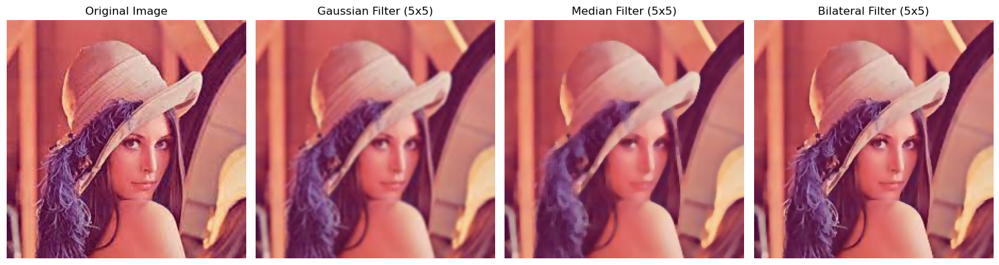

In [223]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(gaussian_filtered_image)
plt.title('Gaussian Filter (5x5)')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(median_filtered_image)
plt.title('Median Filter (5x5)')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(bilateral_filtered_image)
plt.title('Bilateral Filter (5x5)')
plt.axis('off')

plt.tight_layout()
plt.show()

***
## Question3 - PartC
***

In [248]:
psnr_2_1 = cv2.PSNR(filtered_image_3x3, filtered_image_9x9)

In [249]:
psnr_2_2 = cv2.PSNR(filtered_image_3x3, filtered_image_gaussian)

In [250]:
print("PSNR between (II, I):", psnr_2_1)
print("PSNR between (III, I):", psnr_2_2)

PSNR between (II, I): 27.799707931460365
PSNR between (III, I): 43.44503062753417


Based on the provided PSNR values:

- PSNR between (II, I): 27.79
- PSNR between (III, I): 43.44

We can infer the following:

1. The PSNR value between (III, I) is significantly higher than between (II, I). This indicates that the quality of image (III) after applying the filtering process is much closer to image (I) compared to image (II). 

2. A higher PSNR value suggests that the image distortion introduced by the filtering process is lower, meaning that the filtered image (III) retains more details and closely resembles image (I) compared to the filtered image (II). 

3. The filtering process applied in image (III) is more effective in preserving image quality compared to the process applied in image (II). This could be due to the type or parameters of the filters used in each case. 



***
## Question4
***

In [251]:
def histogram_equalization(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=(0,256))

    # Compute cumulative distribution function
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf.max()

    equalized_image = np.interp(image.flatten(), range(256), cdf_normalized * 255).reshape(image.shape)

    return equalized_image.astype(np.uint8)

In [268]:
image = cv2.imread('image4.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [269]:
equalized_image = histogram_equalization(image)

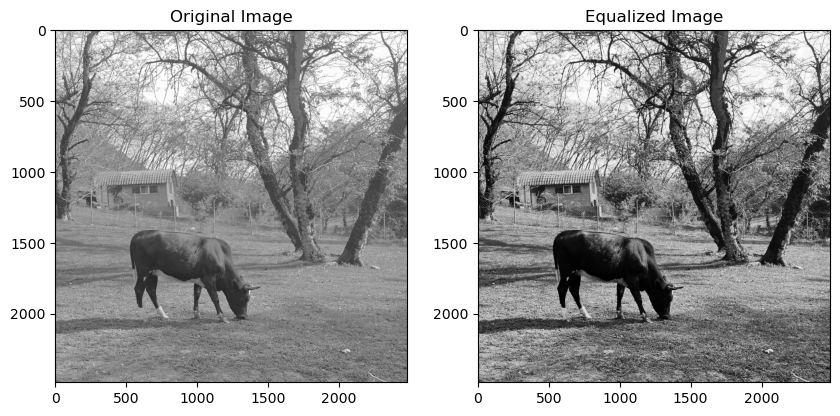

In [270]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.show()

In [271]:
equalized_image_opencv = cv2.equalizeHist(image)

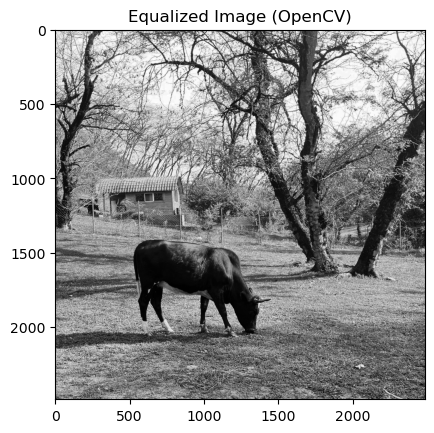

In [272]:
plt.imshow(equalized_image_opencv, cmap='gray')
plt.title('Equalized Image (OpenCV)')
plt.show()

In [274]:
if np.array_equal(equalized_image, equalized_image_opencv):
    print("Both equalized images are the same.")
else:
    print("The equalized images are different.")

The equalized images are different.


Calculate Mean Squared Error (MSE)

In [275]:
mse = np.mean((equalized_image - equalized_image_opencv) ** 2)

Calculate Structural Similarity Index (SSI)

In [278]:
ssi = ssim(equalized_image, equalized_image_opencv)

In [279]:
print("Mean Squared Error (MSE):", mse)
print("Structural Similarity Index (SSI):", ssi)

Mean Squared Error (MSE): 0.4671476747810808
Structural Similarity Index (SSI): 0.999443349587315


the MSE is relatively low and the SSI is close to 1, which indicates that the equalized images obtained from the scratch implementation and the OpenCV library are very similar.

***
## Question5
***

In [280]:
image = cv2.imread('image5.jpg', cv2.IMREAD_COLOR)

In [281]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [282]:
denoised_image = cv2.medianBlur(gray_image, 5)

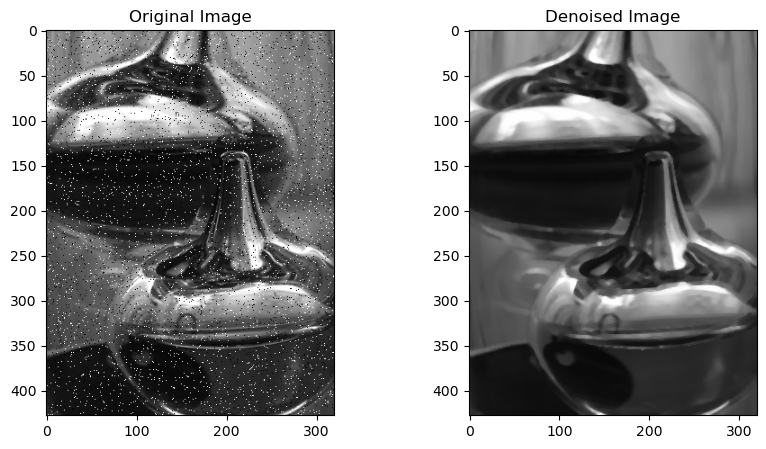

In [283]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2RGB))
plt.title('Denoised Image')
plt.show()

In [284]:
denoised_image = cv2.fastNlMeansDenoising(gray_image, h=10, templateWindowSize=7, searchWindowSize=21)

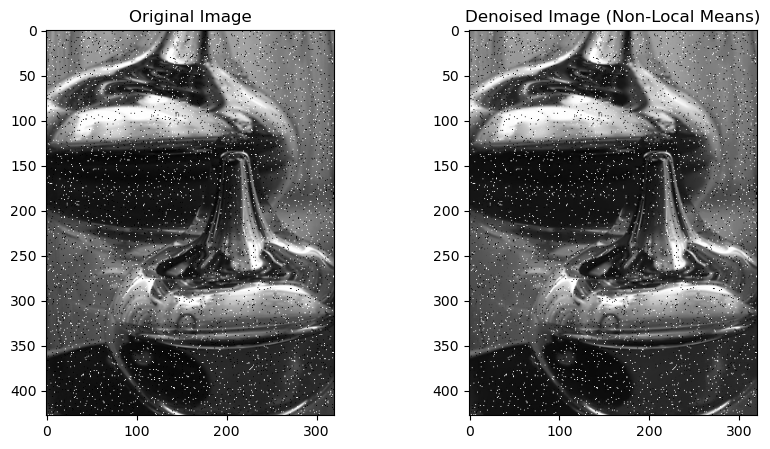

In [285]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2RGB))
plt.title('Denoised Image (Non-Local Means)')
plt.show()

not a good denoising option here

In [286]:
denoised_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

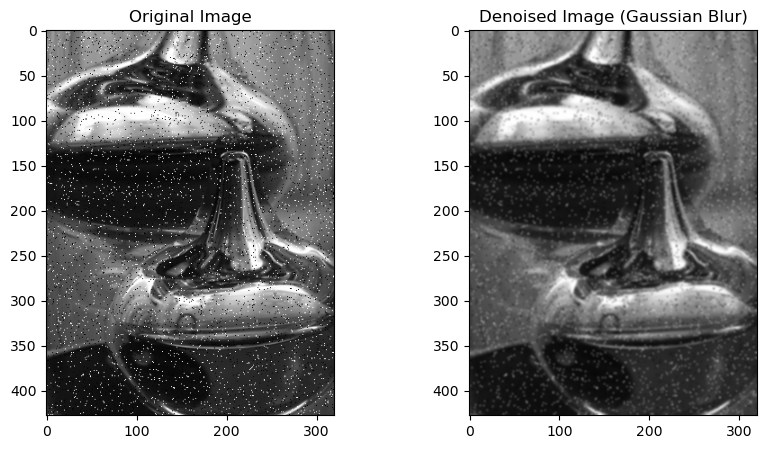

In [287]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2RGB))
plt.title('Denoised Image (Gaussian Blur)')
plt.show()

In [288]:
denoised_image = cv2.bilateralFilter(gray_image, d=9, sigmaColor=75, sigmaSpace=75)

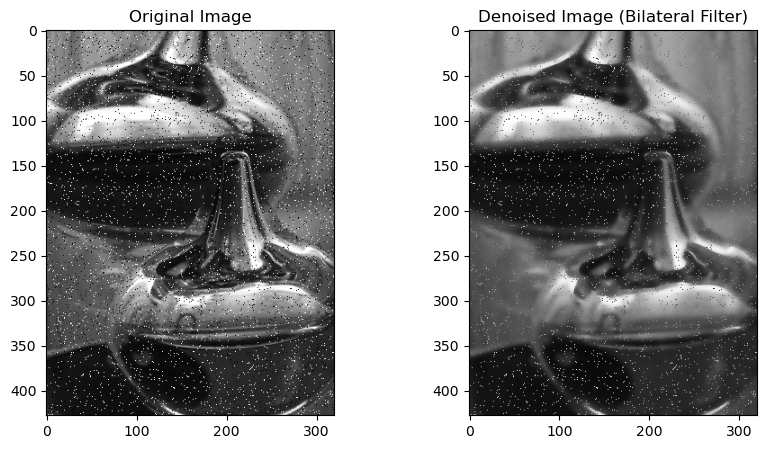

In [289]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2RGB))
plt.title('Denoised Image (Bilateral Filter)')
plt.show()

In [291]:
equalized_image = cv2.equalizeHist(gray_image)

In [292]:
denoised_image = cv2.medianBlur(equalized_image, 5)

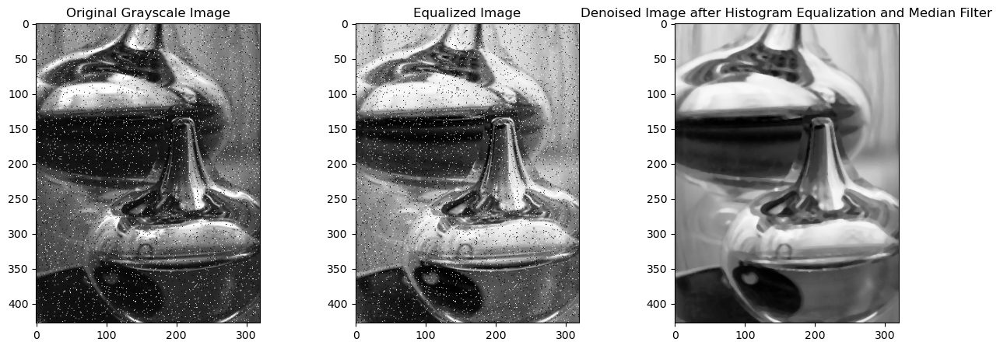

In [293]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB))
plt.title('Original Grayscale Image')
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB))
plt.title('Equalized Image')
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2RGB))
plt.title('Denoised Image after Histogram Equalization and Median Filter')
plt.show()

much better after applying histogram equalization

***
## Question6
***

In [28]:
original_image = cv2.imread('Q6-eye-original.jpg')

In [30]:
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
cv2.imwrite('Q6-eye-original.png', gray_image)

True

Apply Gaussian blur to the grayscale image to obtain the "G" image

In [31]:
blurred_image = cv2.GaussianBlur(gray_image, (0, 0), 10) 

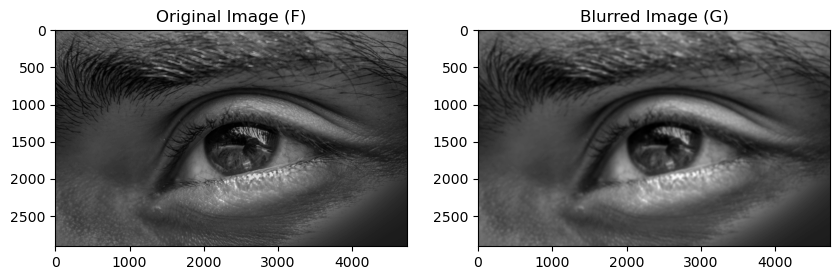

In [32]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image (F)')
plt.subplot(1, 2, 2)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image (G)')
plt.show()

In [33]:
difference_image = cv2.absdiff(gray_image, blurred_image)

In [34]:
alpha_values = [1.0, 2.0, 3.0]  
beta_values = [-0.5, -1.0, -1.5]

(-0.5, 4740.5, 2906.5, -0.5)

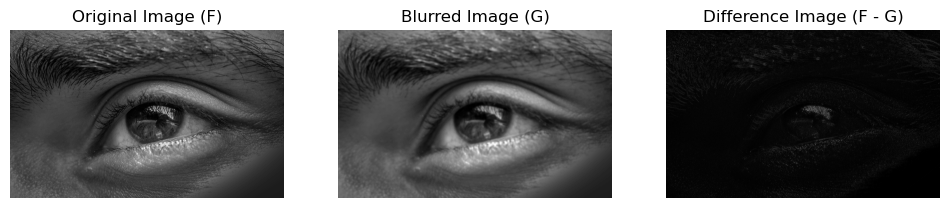

In [35]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image (F)')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image (G)')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(difference_image, cmap='gray')
plt.title('Difference Image (F - G)')
plt.axis('off')

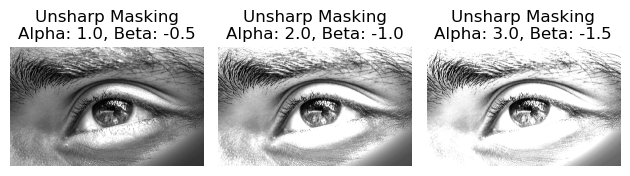

In [36]:
for i, (alpha, beta) in enumerate(zip(alpha_values, beta_values), start=1):
    sharpened_difference_image = cv2.addWeighted(gray_image, 1 + alpha, difference_image, beta, 0)
    if i == 1:
        cv2.imwrite('Q6-eye-modified.png', sharpened_difference_image)
    plt.subplot(2, 3, i + 3)
    plt.imshow(sharpened_difference_image, cmap='gray')
    plt.title(f'Unsharp Masking\nAlpha: {alpha}, Beta: {beta}')
    plt.axis('off')

plt.tight_layout()
plt.show()

***
## Question7
***

In [149]:
with open("input1.txt", 'r') as file:
    height, width, label = map(int, file.readline().strip().split())

    # Read pixel data
    pixels = [
        [
            np.array([
                int(val.replace('(', '').replace(')', '').replace(',', ''))
                for val in line[i:i+3]
            ])
            for i in range(0, len(line), 3)
        ]
        for line in (file.readline().strip().split() for _ in range(height))
    ]

In [150]:
grayscale_pixels = np.array([
    [
        sum(pixel) // 3  
        for pixel in row
    ]
    for row in pixels
], dtype=np.uint8)

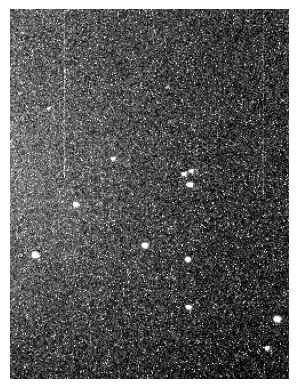

In [151]:
plt.imshow(grayscale_pixels, cmap='gray')
plt.axis('off')
plt.show()

In [152]:
threshold = 245

In [153]:
binary_pixels = np.where(grayscale_pixels > threshold, 255, 0)

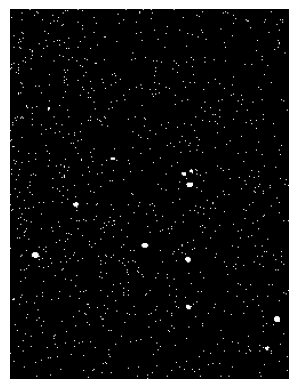

In [154]:
plt.imshow(binary_pixels, cmap='gray')
plt.axis('off')
plt.show()

In [155]:
binary_pixels = binary_pixels.astype(np.uint8)

In [156]:
denoised_pixels = cv2.medianBlur(binary_pixels, 3)

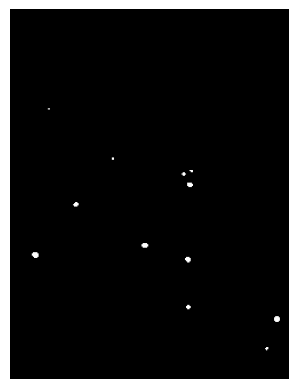

In [157]:
plt.imshow(denoised_pixels, cmap='gray')
plt.axis('off')
plt.show()

In [158]:
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(denoised_pixels, connectivity=8, ltype=cv2.CV_32S)

In [159]:
print("Number of stars detected:", num_labels - 1)

Number of stars detected: 12


In [160]:
print("Coordinates of stars:")
for i in range(1, num_labels):
    print(f"Star {i}: ({centroids[i][0]}, {centroids[i][1]})")

Coordinates of stars:
Star 1: (33.5, 87.0)
Star 2: (89.5, 130.5)
Star 3: (158.2, 141.4)
Star 4: (151.5, 144.0)
Star 5: (156.88235294117646, 153.41176470588235)
Star 6: (57.214285714285715, 170.64285714285714)
Star 7: (117.5, 206.5)
Star 8: (21.666666666666668, 214.875)
Star 9: (155.1578947368421, 218.8421052631579)
Star 10: (155.5, 260.5)
Star 11: (233.0, 271.0)
Star 12: (224.16666666666666, 296.8333333333333)


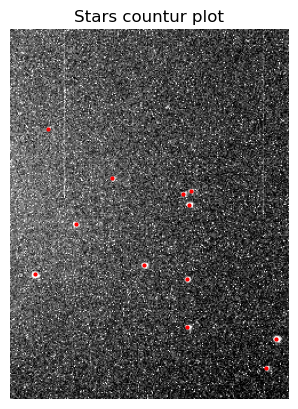

In [161]:
plt.imshow(grayscale_pixels, cmap='gray')  
for i in range(1, num_labels):
    cx, cy = int(centroids[i][0]), int(centroids[i][1])
    plt.plot(cx, cy, 'ro', markersize=2) 

plt.axis('off')
plt.title("Stars countur plot")
plt.show()

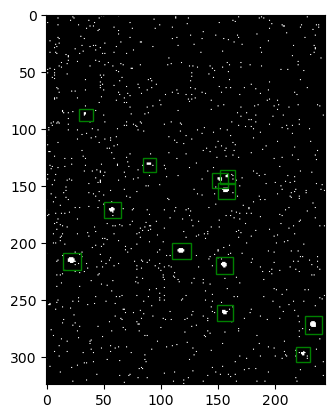

In [169]:
fig, ax = plt.subplots()
ax.imshow(binary_pixels, cmap='gray')

for i in range(1, num_labels):
    x, y, width, height, _ = stats[i]

    x -= 5
    y -= 5
    width += 10
    height += 10
    
    rect = plt.Rectangle((x, y), width, height, edgecolor='g', facecolor='none') 
    ax.add_patch(rect)

plt.show()